In [ ]:
!pip install sidechainnet
!pip install einops

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 47.6 MB 1.6 MB/s 
     |████████████████████████████████| 3.0 MB 35.1 MB/s 
     |████████████████████████████████| 12.8 MB 37.8 MB/s 
  Created wheel for ProDy: filename=ProDy-2.3.1-cp37-cp37m-linux_x86_64.whl size=11753440 sha256=82871e9446febbc8938a484b0376e7d72b7bdb7f8c78a05c2d178d59b4339242
  Stored in directory: /root/.cache/pip/wheels/79/8a/0c/87245ad587e5ebf6e9b97bdf5fb340e466ca82811a1ee7a8e4
Successfully built ProDy
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 41 kB 394 kB/s 


In [ ]:
import random
import os
import torch
from torch import nn, einsum
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import gc
from einops import rearrange, repeat, reduce
from einops.layers.torch import Rearrange
from inspect import isfunction
import sidechainnet as scn
from sidechainnet.examples import losses, models
from sidechainnet.structure.structure import inverse_trig_transform
from sidechainnet.structure.build_info import NUM_ANGLES
import py3Dmol
seed = 0
random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.deterministic = True

/usr/local/lib/python3.7/dist-packages/Bio/pairwise2.py:283: BiopythonDeprecationWarning: Bio.pairwise2 has been deprecated, and we intend to remove it in a future release of Biopython. As an alternative, please consider using Bio.Align.PairwiseAligner as a replacement, and contact the Biopython developers if you still need the Bio.pairwise2 module.
  BiopythonDeprecationWarning,
@> ProDy is configured: verbosity='none'
INFO:.prody:ProDy is configured: verbosity='none'
INFO:.prody:ProDy is configured: auto_secondary=False


In [ ]:
dataloader = scn.load(with_pytorch="dataloaders",batch_size=4, dynamic_batching=False)
print("Available Dataloaders =", list(dataloader.keys()))

SidechainNet(12, 30) was not found in ./sidechainnet_data.


Downloaded SidechainNet to ./sidechainnet_data/sidechainnet_casp12_30.pkl.
SidechainNet was loaded from ./sidechainnet_data/sidechainnet_casp12_30.pkl.
Available Dataloaders = ['train', 'train-eval', 'test', 'valid-10', 'valid-20', 'valid-30', 'valid-40', 'valid-50', 'valid-70', 'valid-90']


In [ ]:
batch = next(iter(dataloader['train']))
print("Protein IDs\n   ", batch.pids)
print("Sequences\n   ", batch.seqs.shape)
print("Evolutionary Data\n   ", batch.evos.shape)
print("Secondary Structure\n   ", batch.secs.shape)
print("Angle Data\n   ", batch.angs.shape)
print("Coordinate Data\n   ", batch.crds.shape)
print("X-ray Resolution\n   ", batch.resolutions)
print("Concatenated Data (seq/evo/2ndary)\n   ", batch.seq_evo_sec.shape)
print("Integer sequence")
print("\tShape:", batch.int_seqs.shape)
print("\tEx:", batch.int_seqs[0,:3])
print("1-hot sequence")
print("\tShape:", batch.seqs.shape)
print("\tEx:\n", batch.seqs[0,:3])

Protein IDs
    ('1H30_d1h30a1', '2JRF_1_A', '2ZF9_1_A', '1JUV_1_A')
Sequences
    torch.Size([4, 194, 20])
Evolutionary Data
    torch.Size([4, 194, 21])
Secondary Structure
    torch.Size([4, 194, 8])
Angle Data
    torch.Size([4, 194, 12])
Coordinate Data
    torch.Size([4, 2716, 3])
X-ray Resolution
    (2.2, None, 1.95, 1.7)
Concatenated Data (seq/evo/2ndary)
    torch.Size([4, 194, 49])
Integer sequence
	Shape: torch.Size([4, 194])
	Ex: tensor([6, 1, 2])
1-hot sequence
	Shape: torch.Size([4, 194, 20])
	Ex:
 tensor([[0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])


In [ ]:
batch.evos[0]

tensor([[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.2872, 0.6624],
        [0.0000, 1.0000, 0.0000,  ..., 0.0000, 0.0000, 1.0000],
        [0.0000, 0.0000, 0.8122,  ..., 0.0000, 0.0000, 0.7846],
        ...,
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]])

In [ ]:
example = 0 
seq, ang, crd, mask, sec = ( batch.str_seqs[example],batch.angs[example], batch.crds[example], batch.msks[example], batch.secs[example])
name = batch.pids[example]
print(f"\nExample using {name}.\n")
print(f"Sequence, Mask, and Secondary Structure:\n{seq}\n{mask}\n{sec}\n")
print(f"Angles:\n{ang[:3]} ...\n")
print(f"Coordinates:\n{crd[:3]} ...\n")


Example using 1H30_d1h30a1.

Sequence, Mask, and Secondary Structure:
HCDGRGGLKLSQDMDTCEDILPCVPFSVAKSVKSLYLGRMFSGTPVIRLRFKRLQPTRLVAEFDFRTFDPEGILLFAGGHQDSTWIVLALRAGRLELQLRYNGVGRVTSSGPVINHGMWQTISVEELARNLVIKVNRDAVMKIAVAGDLFQPERGLYHLNLTVGGIPFHEKDLVQPINPRLDGCMRSWNWL
tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
        0, 0])
tensor([[0, 0, 0,  ..., 1, 0, 0],
        [0, 0, 0,  ..., 1, 0, 0],
        [0, 0,

In [ ]:
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
print(f"Using {device} for training.")

Using cuda for training.


In [ ]:
def exists(val):
    return val is not None

def default(val, d):
    if exists(val):
        return val
    return d() if isfunction(d) else d

def cast_tuple(val, depth = 1):
    return val if isinstance(val, tuple) else (val,) * depth

def init_zero_(layer):
    nn.init.constant_(layer.weight, 0.)
    if exists(layer.bias):
        nn.init.constant_(layer.bias, 0.)

In [ ]:
class Attention(nn.Module):
    def __init__(self, dim, seq_len = None, heads = 8, dim_head = 64, dropout = 0.0, gating = True):
        super().__init__()
        inner_dim = dim_head * heads
        self.seq_len = seq_len
        self.heads= heads
        self.scale = dim_head ** -0.5
        self.to_q = nn.Linear(dim, inner_dim, bias = False)
        self.to_kv = nn.Linear(dim, inner_dim * 2, bias = False)
        self.to_out = nn.Linear(inner_dim, dim)
        self.gating = nn.Linear(dim, inner_dim)
        nn.init.constant_(self.gating.weight, 0.)
        nn.init.constant_(self.gating.bias, 1.)
        self.dropout = nn.Dropout(dropout)
        init_zero_(self.to_out)

    def forward(self, x, mask = None, attn_bias = None, context = None, context_mask = None, tie_dim = None):
        device, orig_shape, h, has_context = x.device, x.shape, self.heads, exists(context)
        context = default(context, x)
        q, k, v = (self.to_q(x), *self.to_kv(context).chunk(2, dim = -1))
        i, j = q.shape[-2], k.shape[-2]
        q, k, v = map(lambda t: rearrange(t, 'b n (h d) -> b h n d', h = h), (q, k, v))
        q = q * self.scale
        if exists(tie_dim):
            q, k = map(lambda t: rearrange(t, '(b r) ... -> b r ...', r = tie_dim), (q, k))
            q = q.mean(dim = 1)
            dots = einsum('b h i d, b r h j d -> b r h i j', q, k)
            dots = rearrange(dots, 'b r ... -> (b r) ...')
        else:
            dots = einsum('b h i d, b h j d -> b h i j', q, k)
        if exists(attn_bias):
            dots = dots + attn_bias
        if exists(mask):
            mask = default(mask, lambda: torch.ones(1, i, device = device).bool())
            context_mask = mask if not has_context else default(context_mask, lambda: torch.ones(1, k.shape[-2], device = device).bool())
            mask_value = -torch.finfo(dots.dtype).max
            mask = mask[:, None, :, None] * context_mask[:, None, None, :]
            try:
                mask = mask.to(torch.bool)
                dots = dots.masked_fill(~mask, mask_value)
            except:
                dots = dots.masked_fill(mask, mask_value)
        dots = dots - dots.max(dim = -1, keepdims = True).values
        attn = dots.softmax(dim = -1)
        attn = self.dropout(attn)
        out = einsum('b h i j, b h j d -> b h i d', attn, v)
        out = rearrange(out, 'b h n d -> b n (h d)')
        gates = self.gating(x)
        out = out * gates.sigmoid()
        out = self.to_out(out)
        return out

In [ ]:
class ProteinNet(nn.Module):
    """A protein sequence-to-angle model that consumes integer-coded sequences."""
    def __init__(self, d_hidden, dim, d_in=21, d_embedding=32, heads = 8, integer_sequence=True, n_angles=scn.structure.build_info.NUM_ANGLES):  
        super(ProteinNet, self).__init__()
        self.d_hidden = d_hidden
        self.attn = Attention(dim = dim, heads = heads)
        self.d_out = n_angles * 2
        self.hidden2out = nn.Sequential(
                            nn.Linear(d_embedding, d_hidden),
                            nn.GELU(),
                            nn.Linear(d_hidden, self.d_out)
                                    )
        self.out2attn = nn.Linear(self.d_out, dim)
        self.final = nn.Sequential(
                            nn.GELU(),
                            nn.Linear(dim, self.d_out))
        self.norm_0 = nn.LayerNorm([dim])
        self.norm_1 = nn.LayerNorm([dim])
        self.activation_0 = nn.GELU()
        self.activation_1 = nn.GELU()                              
        self.output_activation = torch.nn.Tanh()
        self.integer_sequence = integer_sequence
        if self.integer_sequence:
            self.input_embedding = torch.nn.Embedding(d_in, d_embedding, padding_idx=20)
        else:
            self.input_embedding = torch.nn.Linear(d_in, d_embedding)
    def get_lengths(self, sequence):
        """Compute the lengths of each sequence in the batch."""
        if self.integer_sequence:
            lengths = sequence.shape[-1] - (sequence == 20).sum(axis=1)
        else:
            lengths = sequence.shape[1] - (sequence == 0).all(axis=-1).sum(axis=1)
        return lengths.cpu()

    def forward(self, sequence, mask=None):
        """Run one forward step of the model."""
        lengths = self.get_lengths(sequence)
        sequence = self.input_embedding(sequence)
        sequence = torch.nn.utils.rnn.pack_padded_sequence(sequence,
                                                         lengths,
                                                         batch_first=True,
                                                         enforce_sorted=False)
        output, output_lengths = torch.nn.utils.rnn.pad_packed_sequence(sequence,
                                                                      batch_first=True)
        output = self.hidden2out(output)
        output = self.out2attn(output)
        output = self.activation_0(output)
        output = self.norm_0(output)
        output = self.attn(output, mask=mask)
        output = self.activation_1(output)
        output = self.norm_1(output)
        output = self.final(output)
        output = self.output_activation(output)
        output = output.view(output.shape[0], output.shape[1], 12, 2)
        return output

In [ ]:
pssms_model = ProteinNet(d_hidden=512,
                           dim=256,
                           d_in=49,
                           d_embedding=32,
                           integer_sequence=False)
pssms_model = pssms_model.to(device)
pssms_model

ProteinNet(
  (attn): Attention(
    (to_q): Linear(in_features=256, out_features=512, bias=False)
    (to_kv): Linear(in_features=256, out_features=1024, bias=False)
    (to_out): Linear(in_features=512, out_features=256, bias=True)
    (gating): Linear(in_features=256, out_features=512, bias=True)
    (dropout): Dropout(p=0.0, inplace=False)
  )
  (hidden2out): Sequential(
    (0): Linear(in_features=32, out_features=512, bias=True)
    (1): GELU(approximate=none)
    (2): Linear(in_features=512, out_features=24, bias=True)
  )
  (out2attn): Linear(in_features=24, out_features=256, bias=True)
  (final): Sequential(
    (0): GELU(approximate=none)
    (1): Linear(in_features=256, out_features=24, bias=True)
  )
  (norm_0): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
  (norm_1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
  (activation_0): GELU(approximate=none)
  (activation_1): GELU(approximate=none)
  (output_activation): Tanh()
  (input_embedding): Linear(in_fea

In [ ]:
def init_loss_optimizer(model):
    optimizer = torch.optim.Adam(model.parameters())
    batch_losses = []
    epoch_training_losses = []
    epoch_validation10_losses = []
    epoch_validation90_losses = []
    mse_loss = torch.nn.MSELoss()
    return optimizer, batch_losses, epoch_training_losses, epoch_validation10_losses, epoch_validation90_losses, mse_loss
optimizer, batch_losses, epoch_training_losses, epoch_validation10_losses, epoch_validation90_losses, mse_loss = init_loss_optimizer(pssms_model)

In [ ]:
def validation(model, datasplit, mode):
    """Evaluate a model (sequence->sin/cos represented angles [-1,1]) on MSE."""
    total = 0.0
    n = 0
    with torch.no_grad():
        for batch in datasplit:
            if mode == 'seqs':
                seqs = batch.int_seqs.to(device).long()
            elif mode == 'pssms':
                seqs = batch.seq_evo_sec.to(device)
            mask_ = batch.msks.to(device)
            true_angles_sincosine = scn.structure.trig_transform(batch.angs).to(device)
            mask = (batch.angs.ne(0)).unsqueeze(-1).repeat(1, 1, 1, 2)
            predicted_angles = model(seqs, mask = mask_)
            loss = mse_loss(predicted_angles[mask], true_angles_sincosine[mask])
            total += loss
            n += 1
    return torch.sqrt(total/n)

In [ ]:
def train(model, mode, n_epoch):
    for epoch in range(n_epoch):
        print(f'Epoch {epoch}')
        progress_bar = tqdm(total=len(dataloader['train']), smoothing=0)
        for batch in dataloader['train']:
            if mode == 'seqs':
                seqs = batch.int_seqs.to(device).long()
            elif mode == 'pssms':
                seqs = batch.seq_evo_sec.to(device)
            mask_ = batch.msks.to(device)
            true_angles_sincos = scn.structure.trig_transform(batch.angs).to(device)
            mask = (batch.angs.ne(0)).unsqueeze(-1).repeat(1, 1, 1, 2)
            predicted_angles = model(seqs, mask = mask_)
            loss = mse_loss(predicted_angles[mask], true_angles_sincos[mask])
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 2)
            optimizer.step()
            batch_losses.append(float(loss))
            progress_bar.update(1)
            progress_bar.set_description(f"\rRMSE Loss = {np.sqrt(float(loss)):.4f}")
        epoch_training_losses.append(validation(model, dataloader['train-eval'], mode))
        epoch_validation10_losses.append(validation(model, dataloader['valid-10'], mode))
        epoch_validation90_losses.append(validation(model, dataloader['valid-90'], mode))
        print(f"     Train-eval loss = {epoch_training_losses[-1]:.4f}")
        print(f"     Valid-10   loss = {epoch_validation10_losses[-1]:.4f}")
        print(f"     Valid-90   loss = {epoch_validation90_losses[-1]:.4f}")
    print(f"Test loss = {validation(model, dataloader['test'], mode):.4f}")

train(pssms_model, 'pssms', 6)

Epoch 0


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4454
     Valid-10   loss = 0.4634
     Valid-90   loss = 0.4541
Epoch 1


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4409
     Valid-10   loss = 0.4763
     Valid-90   loss = 0.4671
Epoch 2


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4399
     Valid-10   loss = 0.4668
     Valid-90   loss = 0.4553
Epoch 3


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4403
     Valid-10   loss = 0.4691
     Valid-90   loss = 0.4593
Epoch 4


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4253
     Valid-10   loss = 0.4525
     Valid-90   loss = 0.4403
Epoch 5


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4304
     Valid-10   loss = 0.4631
     Valid-90   loss = 0.4559
Test loss = 0.4503


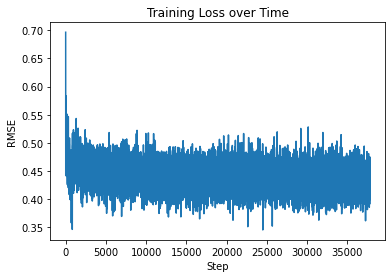

In [ ]:
plt.plot(np.sqrt(np.asarray(batch_losses)), label='batch loss')
plt.ylabel("RMSE")
plt.xlabel("Step")
plt.title("Training Loss over Time")
plt.show()

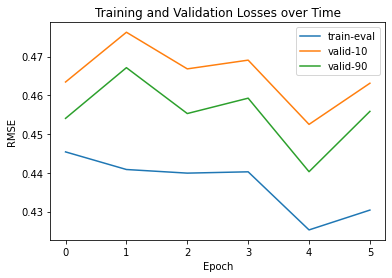

In [ ]:
plt.plot([x.cpu().detach().numpy() for x in epoch_training_losses], label='train-eval')
plt.plot([x.cpu().detach().numpy() for x in epoch_validation10_losses], label='valid-10')
plt.plot([x.cpu().detach().numpy() for x in epoch_validation90_losses], label='valid-90')
plt.ylabel("RMSE")
plt.xlabel("Epoch")
plt.title("Training and Validation Losses over Time")
plt.legend()
plt.show()

In [ ]:
def build_visualizable_structures(model, data, mode=None):
    """Build visualizable structures for one batch of model's predictions on data."""
    with torch.no_grad():
        for batch in data:
            if mode == "seqs":
                model_input = batch.int_seqs.to(device)
            elif mode == "pssms":
                model_input = batch.seq_evo_sec.to(device)
            mask_ = batch.msks.to(device)
            predicted_angles_sincos = model(model_input, mask = mask_)
            predicted_angles = inverse_trig_transform(predicted_angles_sincos)
            sb_pred = scn.BatchedStructureBuilder(batch.int_seqs, predicted_angles.cpu())
            sb_true = scn.BatchedStructureBuilder(batch.int_seqs, batch.crds.cpu())
            break
    return sb_pred, sb_true

In [ ]:
def plot_protein(exp1, exp2):
    p = py3Dmol.view(js='https://3dmol.org/build/3Dmol.js', viewergrid=(2,1))
    p.addModel(open(exp1,'r').read(),'pdb', viewer=(0,0))
    p.addModel(open(exp2,'r').read(),'pdb', viewer=(1,0))
    p.setStyle({'cartoon': {'color':'spectrum'}})
    p.zoomTo()
    p.show()

## Example-1

In [ ]:
s_pred, s_true = build_visualizable_structures(pssms_model, dataloader["train"], mode="pssms")
z_idx = 0
idx = 0
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example-2

In [ ]:
idx = 1
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example-3

In [ ]:
idx = 2
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 4

In [ ]:
idx = 3
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 5

In [ ]:
s_pred, s_true = build_visualizable_structures(pssms_model, dataloader["train"], mode="pssms")
z_idx = 1
idx = 0
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 6

In [ ]:
idx = 1
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 7

In [ ]:
idx = 2
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 8

In [ ]:
idx = 3
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [ ]:
gc.collect()
torch.cuda.empty_cache()

In [ ]:
seqonly_model = ProteinNet(d_hidden=512,
                           dim=256,
                           d_in=49,
                           d_embedding=32,
                           integer_sequence=True)
seqonly_model = seqonly_model.to(device)
optimizer, batch_losses, epoch_training_losses, epoch_validation10_losses, epoch_validation90_losses, mse_loss = init_loss_optimizer(seqonly_model)
train(seqonly_model, 'seqs', 6)

Epoch 0


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = nan
     Valid-10   loss = 0.4711
     Valid-90   loss = 0.4591
Epoch 1


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4475
     Valid-10   loss = 0.4527
     Valid-90   loss = 0.4422
Epoch 2


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4367
     Valid-10   loss = 0.4435
     Valid-90   loss = 0.4345
Epoch 3


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4501
     Valid-10   loss = 0.4569
     Valid-90   loss = 0.4460
Epoch 4


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4495
     Valid-10   loss = 0.4572
     Valid-90   loss = 0.4412
Epoch 5


  0%|          | 0/6304 [00:00<?, ?it/s]

     Train-eval loss = 0.4582
     Valid-10   loss = 0.4663
     Valid-90   loss = 0.4511
Test loss = 0.4547


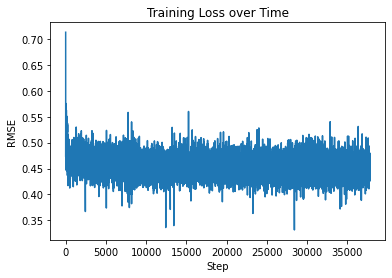

In [ ]:
plt.plot(np.sqrt(np.asarray(batch_losses)), label='batch loss')
plt.ylabel("RMSE")
plt.xlabel("Step")
plt.title("Training Loss over Time")
plt.show()

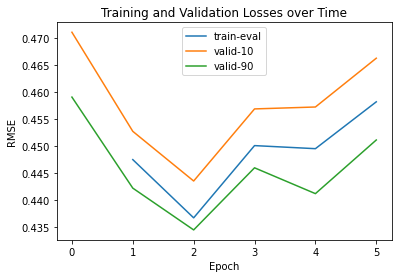

In [ ]:
plt.plot([x.cpu().detach().numpy() for x in epoch_training_losses], label='train-eval')
plt.plot([x.cpu().detach().numpy() for x in epoch_validation10_losses], label='valid-10')
plt.plot([x.cpu().detach().numpy() for x in epoch_validation90_losses], label='valid-90')
plt.ylabel("RMSE")
plt.xlabel("Epoch")
plt.title("Training and Validation Losses over Time")
plt.legend()
plt.show()

# Inference (Sequences -> Angles)

## Example - 9

In [ ]:
s_pred, s_true = build_visualizable_structures(seqonly_model, dataloader["train"], mode="seqs")
z_idx = 2
idx = 0
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 10

In [ ]:
idx = 1
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 11

In [ ]:
idx = 2
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 12

In [ ]:
idx = 3
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 13

In [ ]:
s_pred, s_true = build_visualizable_structures(pssms_model, dataloader["train"], mode="pssms")
z_idx = 3
idx = 0
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 14

In [ ]:
idx = 1
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 15

In [ ]:
idx = 2
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Example - 16

In [ ]:
idx = 3
s_pred.to_pdb(idx,path='{}_{}_pred.pdb'.format(idx, z_idx))
s_true.to_pdb(idx,path='{}_{}_true.pdb'.format(idx, z_idx))
plot_protein('{}_{}_pred.pdb'.format(idx, z_idx), '{}_{}_true.pdb'.format(idx, z_idx))

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol